In [ ]:
!pip install timm pandas --quiet

# DINO

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [7]:
import pandas as pd
CSV_PATH = "/content/drive/MyDrive/FYP/foci_v01_natural+clear+simul_from_scratch.csv"
LABEL_COL = "label"

df = pd.read_csv(CSV_PATH)


# counts of each label value (0/1)
counts = df[LABEL_COL].value_counts(dropna=False).sort_index()

print("Label counts:")
print(counts)

n0 = int(counts.get(0, 0))
n1 = int(counts.get(1, 0))
print(f"\n# label 0: {n0}")
print(f"# label 1: {n1}")
print(f"Total: {len(df)}")


Label counts:
label
0    18651
1    19845
Name: count, dtype: int64

# label 0: 18651
# label 1: 19845
Total: 38496


In [ ]:
# ============================================================
# - SSL trains on an unlabeled image CSV (image_path)
# - kNN probe evaluates teacher backbone features using labeled CSV (image_path,label)
# - Supervised split is random: 0.8 / 0.1 / 0.1 (stratified)
# ============================================================

import os, time, random
import numpy as np
import pandas as pd
from dataclasses import dataclass
from PIL import Image, UnidentifiedImageError

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
import matplotlib.pyplot as plt
from tqdm import tqdm
import timm

# -----------------------
# Config
# -----------------------
IMAGE_SIZE = 224
LABEL_COL = "label"

# Labeled CSV for kNN probe (must have: image_path,label)
CSV_PATH_SUP = "/content/drive/MyDrive/FYP/foci_labels_v02.csv"

# SSL CSV for unlabeled images (must have: image_path)
CSV_PATH_SSL = "/content/drive/MyDrive/FYP/foci_v01_natural+clear+simul_from_scratch.csv"

# Split ratios for the labeled CSV used in kNN probe
TRAIN_FRAC = 0.8
VAL_FRAC   = 0.1
TEST_FRAC  = 0.1
SPLIT_SEED = 42

BATCH_SSL  = 64
BATCH_EVAL = 64
NUM_EPOCHS = 50
EVAL_EVERY = 10
KNN_K      = 20

LR = 1e-4
WD = 1e-4
TEACHER_MOMENTUM = 0.996

NORM_MEAN = [0.5, 0.5, 0.5]
NORM_STD  = [0.25, 0.25, 0.25]

# Save teacher backbone
SSL_BACKBONE_SAVE_PATH = "/content/drive/MyDrive/FYP/foci_dino_backbone_clean_v01.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------
# Utilities
# -----------------------
def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SPLIT_SEED)

def exists_path(p: str) -> bool:
    try:
        return os.path.exists(p)
    except Exception:
        return False

def stratified_split(df: pd.DataFrame, label_col: str, train_frac: float, val_frac: float, test_frac: float, seed: int):
    assert abs(train_frac + val_frac + test_frac - 1.0) < 1e-6
    parts = []
    for lbl, df_lbl in df.groupby(label_col):
        df_lbl = df_lbl.sample(frac=1, random_state=seed).reset_index(drop=True)
        n = len(df_lbl)
        n_train = int(round(n * train_frac))
        n_val   = int(round(n * val_frac))
        # ensure total = n
        n_test  = n - n_train - n_val
        df_train = df_lbl.iloc[:n_train].copy()
        df_val   = df_lbl.iloc[n_train:n_train + n_val].copy()
        df_test  = df_lbl.iloc[n_train + n_val:].copy()
        parts.append((df_train, df_val, df_test))

    df_train = pd.concat([p[0] for p in parts]).sample(frac=1, random_state=seed).reset_index(drop=True)
    df_val   = pd.concat([p[1] for p in parts]).sample(frac=1, random_state=seed).reset_index(drop=True)
    df_test  = pd.concat([p[2] for p in parts]).sample(frac=1, random_state=seed).reset_index(drop=True)
    return df_train, df_val, df_test

In [ ]:
# -----------------------
# Datasets
# -----------------------
class DINOUnlabeledDatasetSafe(Dataset):
    """
    Returns two global augmented views (v1, v2).
    On read failure: tries other indices; else returns None (collate drops it).
    """
    def __init__(self, df, transform_global, max_retry=5, sleep_retry=0.05, try_alt=6):
        self.paths = df["image_path"].tolist()
        self.transform = transform_global
        self.max_retry = int(max_retry)
        self.sleep_retry = float(sleep_retry)
        self.try_alt = int(try_alt)

    def __len__(self):
        return len(self.paths)

    def _open_with_retry(self, path):
        last_e = None
        for _ in range(self.max_retry):
            try:
                with Image.open(path) as im:
                    return im.convert("RGB").copy()
            except (OSError, UnidentifiedImageError) as e:
                last_e = e
                time.sleep(self.sleep_retry)
        raise last_e

    def __getitem__(self, idx):
        for _ in range(self.try_alt):
            path = self.paths[idx]
            try:
                img = self._open_with_retry(path)
                v1 = self.transform(img)
                v2 = self.transform(img)
                return v1, v2
            except Exception:
                idx = random.randint(0, len(self.paths) - 1)
        return None

def ssl_safe_collate(batch):
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None
    v1, v2 = zip(*batch)
    return torch.stack(v1, 0), torch.stack(v2, 0)

class LabeledImageDatasetSafe(Dataset):
    """
    Returns (x, y). If image read fails, returns None (collate drops it).
    """
    def __init__(self, df, transform, label_col="label", max_retry=5, sleep_retry=0.05):
        self.paths = df["image_path"].tolist()
        self.labels = df[label_col].astype(int).tolist()
        self.transform = transform
        self.max_retry = int(max_retry)
        self.sleep_retry = float(sleep_retry)

    def __len__(self):
        return len(self.paths)

    def _open_with_retry(self, path):
        last_e = None
        for _ in range(self.max_retry):
            try:
                with Image.open(path) as im:
                    return im.convert("RGB").copy()
            except (OSError, UnidentifiedImageError) as e:
                last_e = e
                time.sleep(self.sleep_retry)
        raise last_e

    def __getitem__(self, idx):
        path = self.paths[idx]
        y = self.labels[idx]
        try:
            img = self._open_with_retry(path)
            x = self.transform(img)
            return x, torch.tensor(y, dtype=torch.long)
        except Exception:
            return None

def sup_safe_collate(batch):
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None
    xs, ys = zip(*batch)
    return torch.stack(xs, 0), torch.stack(ys, 0)

# -----------------------
# Transforms
# -----------------------
global_transform = T.Compose([
    T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(degrees=20),
    T.ToTensor(),
    T.Normalize(mean=NORM_MEAN, std=NORM_STD),
])

eval_transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(IMAGE_SIZE),
    T.ToTensor(),
    T.Normalize(mean=NORM_MEAN, std=NORM_STD),
])

# -----------------------
# Load CSVs
# -----------------------
df_sup = pd.read_csv(CSV_PATH_SUP).drop_duplicates(subset=["image_path"]).reset_index(drop=True)
df_sup = df_sup[df_sup["image_path"].apply(exists_path)].reset_index(drop=True)
assert "image_path" in df_sup.columns and LABEL_COL in df_sup.columns, "Supervised CSV must have image_path,label"

df_ssl = pd.read_csv(CSV_PATH_SSL).drop_duplicates(subset=["image_path"]).reset_index(drop=True)
assert "image_path" in df_ssl.columns, "SSL CSV must have image_path"
df_ssl = df_ssl[df_ssl["image_path"].apply(exists_path)].reset_index(drop=True)

print("Supervised labeled images:", len(df_sup), " | label counts:", df_sup[LABEL_COL].value_counts().to_dict())
print("SSL unlabeled images:", len(df_ssl))

# -----------------------
# Split labeled data (0.8/0.1/0.1 stratified)
# -----------------------
df_train, df_val, df_test = stratified_split(df_sup, LABEL_COL, TRAIN_FRAC, VAL_FRAC, TEST_FRAC, SPLIT_SEED)

print("\nSupervised splits (stratified):")
print("Train:", len(df_train), df_train[LABEL_COL].value_counts().to_dict())
print("Val:  ", len(df_val),   df_val[LABEL_COL].value_counts().to_dict())
print("Test: ", len(df_test),  df_test[LABEL_COL].value_counts().to_dict())

# -----------------------
# DataLoaders
# -----------------------
unlab_dataset = DINOUnlabeledDatasetSafe(df_ssl[["image_path"]], transform_global=global_transform)
unlab_loader = DataLoader(
    unlab_dataset,
    batch_size=BATCH_SSL,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    drop_last=True,
    collate_fn=ssl_safe_collate,
    persistent_workers=True,
    prefetch_factor=2
)

train_eval_ds = LabeledImageDatasetSafe(df_train, transform=eval_transform, label_col=LABEL_COL)
val_eval_ds   = LabeledImageDatasetSafe(df_val,   transform=eval_transform, label_col=LABEL_COL)
test_eval_ds  = LabeledImageDatasetSafe(df_test,  transform=eval_transform, label_col=LABEL_COL)

train_eval_loader = DataLoader(train_eval_ds, batch_size=BATCH_EVAL, shuffle=False, num_workers=2, pin_memory=True,
                              collate_fn=sup_safe_collate, persistent_workers=True, prefetch_factor=2)
val_eval_loader   = DataLoader(val_eval_ds,   batch_size=BATCH_EVAL, shuffle=False, num_workers=2, pin_memory=True,
                              collate_fn=sup_safe_collate, persistent_workers=True, prefetch_factor=2)
test_eval_loader  = DataLoader(test_eval_ds,  batch_size=BATCH_EVAL, shuffle=False, num_workers=2, pin_memory=True,
                              collate_fn=sup_safe_collate, persistent_workers=True, prefetch_factor=2)

print("\nUnlabeled images used for SSL:", len(unlab_dataset))

In [ ]:
# -----------------------
# Model: ViT backbone + DINO head
# -----------------------
class ViTBackbone(nn.Module):
    def __init__(self, name="vit_tiny_patch16_224", pretrained=True):
        super().__init__()
        self.vit = timm.create_model(
            name,
            pretrained=pretrained,
            num_classes=0,
            global_pool=""
        )

    def forward(self, x):
        feats = self.vit.forward_features(x)
        # timm sometimes returns dict
        if isinstance(feats, dict):
            feats = feats.get("x", feats.get("pooled", feats))
        # If (B, tokens, D): take CLS token
        if feats.dim() == 3:
            feats = feats[:, 0, :]
        return feats  # (B, D)

class DINOHead(nn.Module):
    def __init__(self, in_dim, out_dim=256, hidden_dim=2048, bottleneck_dim=256):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.GELU(),
            nn.Linear(hidden_dim, bottleneck_dim),
            nn.GELU(),
            nn.Linear(bottleneck_dim, out_dim),
        )

    def forward(self, x):
        return self.mlp(x)

class DINOStudentTeacher(nn.Module):
    def __init__(self,
                 backbone_name="vit_tiny_patch16_224",
                 backbone_pretrained=True,
                 out_dim=256,
                 hidden_dim=2048,
                 bottleneck_dim=256):
        super().__init__()
        self.backbone = ViTBackbone(backbone_name, pretrained=backbone_pretrained)
        # infer dim
        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            in_dim = self.backbone(dummy).shape[-1]
        self.head = DINOHead(in_dim, out_dim, hidden_dim, bottleneck_dim)

    def forward(self, x):
        feats = self.backbone(x)
        out = self.head(feats)
        return out

# -----------------------
# DINO Loss (2-view version)
# -----------------------
@dataclass
class DINOLossConfig:
    out_dim: int = 256
    teacher_temp: float = 0.04
    student_temp: float = 0.1
    center_momentum: float = 0.9

class DINOLoss(nn.Module):
    def __init__(self, cfg: DINOLossConfig):
        super().__init__()
        self.cfg = cfg
        self.register_buffer("center", torch.zeros(1, cfg.out_dim))

    def forward(self, student_outputs, teacher_outputs):
        st = self.cfg.student_temp
        tt = self.cfg.teacher_temp

        # student probabilities
        student_probs = [F.softmax(s / st, dim=-1) for s in student_outputs]

        # teacher probabilities (centered)
        with torch.no_grad():
            teacher_probs = []
            for t in teacher_outputs:
                t = (t - self.center)
                t = F.softmax(t / tt, dim=-1)
                teacher_probs.append(t)

        # cross-view CE
        total_loss = 0.0
        n_terms = 0
        for i, t_p in enumerate(teacher_probs):
            for j, s_p in enumerate(student_probs):
                if i == j:
                    continue
                loss = torch.sum(-t_p * torch.log(s_p + 1e-6), dim=-1)
                total_loss += loss.mean()
                n_terms += 1

        total_loss /= max(1, n_terms)

        # update center
        with torch.no_grad():
            batch_center = torch.cat(teacher_probs, dim=0).mean(dim=0, keepdim=True)
            self.center = self.center * self.cfg.center_momentum + batch_center * (1.0 - self.cfg.center_momentum)

        return total_loss

In [ ]:
# -----------------------
# Build student/teacher
# -----------------------
OUT_DIM = 256
student = DINOStudentTeacher("vit_tiny_patch16_224", True, OUT_DIM).to(device)
teacher = DINOStudentTeacher("vit_tiny_patch16_224", True, OUT_DIM).to(device)

teacher.load_state_dict(student.state_dict())
for p in teacher.parameters():
    p.requires_grad = False

dino_loss_fn = DINOLoss(DINOLossConfig(out_dim=OUT_DIM)).to(device)
optimizer = torch.optim.AdamW(student.parameters(), lr=LR, weight_decay=WD)

@torch.no_grad()
def update_teacher(student, teacher, m):
    for ps, pt in zip(student.parameters(), teacher.parameters()):
        pt.data.mul_(m).add_(ps.data, alpha=(1.0 - m))

# -----------------------
# kNN probe
# -----------------------
@torch.no_grad()
def extract_features(backbone: nn.Module, loader: DataLoader):
    backbone.eval()
    feats_all, labels_all = [], []
    for batch in tqdm(loader, desc="Extract feats", leave=False):
        if batch is None:
            continue
        x, y = batch
        x = x.to(device, non_blocking=True)
        f = backbone(x)
        f = F.normalize(f, dim=-1)
        feats_all.append(f.cpu())
        labels_all.append(y.cpu())
    if len(feats_all) == 0:
        return None, None
    return torch.cat(feats_all, dim=0), torch.cat(labels_all, dim=0)

@torch.no_grad()
def knn_accuracy(train_feats, train_labels, val_feats, val_labels, k=20):
    sims = val_feats @ train_feats.T
    topk = sims.topk(k=k, dim=1).indices
    topk_labels = train_labels[topk]

    preds = []
    num_classes = int(train_labels.max().item()) + 1
    for row in topk_labels:
        counts = torch.bincount(row, minlength=num_classes)
        preds.append(counts.argmax().item())
    preds = torch.tensor(preds)

    return (preds == val_labels).float().mean().item()

In [ ]:
# -----------------------
# SSL training loop
# -----------------------
ssl_loss_history = []
knn_val_history = []

student.train()
teacher.eval()

for epoch in range(NUM_EPOCHS):
    epoch_loss = 0.0
    n_batches = 0

    for batch in tqdm(unlab_loader, desc=f"SSL Epoch {epoch+1}/{NUM_EPOCHS}"):
        if batch is None:
            continue
        v1, v2 = batch
        v1 = v1.to(device, non_blocking=True)
        v2 = v2.to(device, non_blocking=True)

        s1 = student(v1)
        s2 = student(v2)

        with torch.no_grad():
            t1 = teacher(v1)
            t2 = teacher(v2)

        loss = dino_loss_fn([s1, s2], [t1, t2])

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()
        update_teacher(student, teacher, TEACHER_MOMENTUM)

        epoch_loss += loss.item()
        n_batches += 1

    avg_loss = epoch_loss / max(1, n_batches)
    ssl_loss_history.append(avg_loss)
    print(f"Epoch {epoch+1}/{NUM_EPOCHS} - SSL DINO Loss: {avg_loss:.4f}")

    # Periodic kNN probe on VAL
    if (epoch + 1) % EVAL_EVERY == 0 or epoch == 0:
        print(f"\n[kNN probe] Epoch {epoch+1}: extracting teacher backbone features...")
        tr_f, tr_y = extract_features(teacher.backbone, train_eval_loader)
        va_f, va_y = extract_features(teacher.backbone, val_eval_loader)

        if tr_f is None or va_f is None:
            print("[kNN probe] Skipped (no valid batches).")
        else:
            acc = knn_accuracy(tr_f, tr_y, va_f, va_y, k=KNN_K)
            knn_val_history.append((epoch + 1, acc))
            print(f"[kNN probe] VAL accuracy @k={KNN_K}: {acc*100:.2f}%\n")

# -----------------------
# Plots
# -----------------------
plt.figure()
plt.plot(range(1, len(ssl_loss_history) + 1), ssl_loss_history, marker="o")
plt.xlabel("Epoch")
plt.ylabel("SSL DINO Loss")
plt.title("DINO SSL Training Loss")
plt.grid(True)
plt.show()

if len(knn_val_history) > 0:
    xs = [e for e, _ in knn_val_history]
    ys = [a for _, a in knn_val_history]
    plt.figure()
    plt.plot(xs, ys, marker="o")
    plt.xlabel("Epoch")
    plt.ylabel("kNN Val Accuracy")
    plt.title(f"kNN Probe on Val (k={KNN_K}) using Teacher Backbone Features")
    plt.grid(True)
    plt.show()

# -----------------------
# Save teacher backbone
# -----------------------
torch.save(teacher.backbone.state_dict(), SSL_BACKBONE_SAVE_PATH)
print("\nSaved DINO-pretrained backbone to:", SSL_BACKBONE_SAVE_PATH)

In [ ]:
# -----------------------
# final kNN on test
# -----------------------
print("\n[Final kNN] Evaluating on TEST...")
tr_f, tr_y = extract_features(teacher.backbone, train_eval_loader)
te_f, te_y = extract_features(teacher.backbone, test_eval_loader)
if tr_f is not None and te_f is not None:
    test_acc = knn_accuracy(tr_f, tr_y, te_f, te_y, k=KNN_K)
    print(f"[Final kNN] TEST accuracy @k={KNN_K}: {test_acc*100:.2f}%")
else:
    print("[Final kNN] Skipped (no valid batches).")

# V05 training

In [ ]:
# =========================
# Configs
# =========================
import os, math, random
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
import torchvision.transforms.functional as TF

import timm
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# --------- Repro ---------
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

# --------- Device ---------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------- Model / image ---------
IMAGE_SIZE = 224
PATCH_SIZE = 16
GRID = IMAGE_SIZE // PATCH_SIZE  # 14
N_PATCH = GRID * GRID            # 196

# --------- Paths ---------
CSV_PATH = "/content/drive/MyDrive/FYP/foci_simulation_from_scratch/sim_v8_fociChannel_surfaceMatched_224/synthetic_all.csv"
BACKBONE_CKPT = "/content/drive/MyDrive/FYP/foci_dino_backbone_v05_simulted_foci_natural+clear_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates.pth"
SAVE_CKPT = "/content/drive/MyDrive/FYP/foci_maskguided_mil_head_best_v1_simulated_from_scratch.pth"

# --------- Split ---------
TRAIN_FRAC = 0.80
VAL_FRAC   = 0.10  # test = remainder

# --------- Train ---------
BATCH = 16
NUM_EPOCHS = 30
LR_HEAD = 1e-4
WD = 1e-4
NUM_WORKERS = 2

# --------- Loss weights (tune) ---------
LAMBDA_PATCH = 1.0      # patch BCE (mask supervision)
LAMBDA_BG    = 0.3      # penalize activation outside mask (positives)
LAMBDA_COV   = 0.6      # encourage multiple inside-mask patches to activate (positives)

# For "capture most foci": top-k inside coverage
TOPK_INSIDE = 6

# --------- Mask processing ---------
DILATE_KERNEL = 7       # Bigger helps tiny foci survive patch downsample.

# --------- Normalization ---------
NORM_MEAN = (0.5, 0.5, 0.5)
NORM_STD  = (0.25, 0.25, 0.25)


Using device: cuda


In [ ]:
import os, time
import numpy as np
from PIL import Image, ImageFile
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import torchvision.transforms as T
import torchvision.transforms.functional as TF

ImageFile.LOAD_TRUNCATED_IMAGES = True

class FociMaskedDataset(Dataset):
    """
    df must contain: image_path, mask_path, label
    Returns:
      x: (3, IMAGE_SIZE, IMAGE_SIZE) float normalized
      y: float32 scalar tensor
      m_patch: (196,) float32 {0,1}
    On ANY issue: returns None (collate_fn drops it)
    """
    def __init__(self, df, train=True, dilate_kernel=7, max_retry=3, sleep_retry=0.02, verbose=True):
        self.df = df.reset_index(drop=True)
        self.train = bool(train)
        self.dilate_kernel = int(dilate_kernel)
        self.max_retry = int(max_retry)
        self.sleep_retry = float(sleep_retry)
        self.verbose = bool(verbose)

        self.color = T.ColorJitter(brightness=0.12, contrast=0.12)
        self.blur  = T.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))

        need = {"image_path", "mask_path", "label"}
        cols = set(self.df.columns)
        missing = need - cols
        if missing:
            raise ValueError(f"Dataset df missing columns: {missing}. Found: {list(self.df.columns)}")

    def __len__(self):
        return len(self.df)

    def _is_bad_path(self, p):
        # catches NaN, None, empty, "nan"
        if p is None:
            return True
        if isinstance(p, float) and np.isnan(p):
            return True
        p = str(p).strip()
        if p == "" or p.lower() == "nan":
            return True
        return False

    def _open_with_retry(self, path):
        """
        Retries only for transient OSError (e.g., Errno 5 from Drive).
        If file doesn't exist: fail immediately.
        """
        if not os.path.exists(path):
            raise FileNotFoundError(path)

        last_e = None
        for _ in range(self.max_retry):
            try:
                with Image.open(path) as im:
                    return im.copy()
            except OSError as e:
                last_e = e
                time.sleep(self.sleep_retry)

        raise last_e

    def _load_img(self, p):
        img = self._open_with_retry(p).convert("RGB")
        img = img.resize((IMAGE_SIZE, IMAGE_SIZE), resample=Image.BILINEAR)
        return img

    def _load_mask01(self, p):
        m = self._open_with_retry(p).convert("L")
        m = m.resize((IMAGE_SIZE, IMAGE_SIZE), resample=Image.NEAREST)
        m = TF.to_tensor(m)         # (1,H,W) in [0,1]
        m = (m > 0.5).float()
        return m

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img_path = row["image_path"]
        mask_path = row["mask_path"]

        if self._is_bad_path(img_path) or self._is_bad_path(mask_path):
            if self.verbose:
                print(f"\n[DATA WARN] Skipping idx={idx} (bad path)")
                print(f"  image_path={img_path}")
                print(f"  mask_path ={mask_path}\n")
            return None

        img_path = str(img_path).strip()
        mask_path = str(mask_path).strip()

        # ---- label parsing
        try:
            y = float(int(row["label"]))
        except Exception:
            try:
                y = float(row["label"])
            except Exception:
                if self.verbose:
                    print(f"\n[DATA WARN] Skipping idx={idx} (bad label): {row['label']}\n")
                return None

        # ---- load files
        try:
            img = self._load_img(img_path)
            m   = self._load_mask01(mask_path)
        except Exception as e:
            if self.verbose:
                print(f"\n[DATA WARN] Skipping idx={idx}")
                print(f"  image_path={img_path}")
                print(f"  mask_path ={mask_path}")
                print(f"  error={repr(e)}\n")
            return None

        # ---- augmentation
        try:
            if self.train:
                if torch.rand(1).item() < 0.5:
                    img = TF.hflip(img); m = TF.hflip(m)
                if torch.rand(1).item() < 0.5:
                    img = TF.vflip(img); m = TF.vflip(m)

                angle = float(torch.empty(1).uniform_(-12, 12).item())
                img = TF.rotate(img, angle, interpolation=TF.InterpolationMode.BILINEAR, fill=0)
                m   = TF.rotate(m, angle, interpolation=TF.InterpolationMode.NEAREST, fill=0)

                if torch.rand(1).item() < 0.8:
                    img = self.color(img)
                if torch.rand(1).item() < 0.35:
                    img = self.blur(img)
        except Exception as e:
            if self.verbose:
                print(f"\n[AUG WARN] Skipping idx={idx} due to augmentation error: {repr(e)}\n")
            return None

        # ---- optional dilation
        try:
            if self.dilate_kernel and self.dilate_kernel > 1:
                k = self.dilate_kernel
                pad = k // 2
                m = F.max_pool2d(m.unsqueeze(0), kernel_size=k, stride=1, padding=pad).squeeze(0)
                m = (m > 0.5).float()
        except Exception as e:
            if self.verbose:
                print(f"\n[MASK WARN] Skipping idx={idx} due to mask op error: {repr(e)}\n")
            return None

        # ---- to tensor + normalize
        try:
            x = TF.to_tensor(img)
            x = TF.normalize(x, mean=NORM_MEAN, std=NORM_STD)

            # Mask -> 14x14 grid (max pool)
            m_grid = F.max_pool2d(
                m.unsqueeze(0),
                kernel_size=PATCH_SIZE,
                stride=PATCH_SIZE
            ).squeeze(0)  # (1,14,14)

            m_grid = (m_grid > 0.5).float()
            m_patch = m_grid.view(-1).to(torch.float32)  # (196,)
        except Exception as e:
            if self.verbose:
                print(f"\n[POST WARN] Skipping idx={idx} due to postproc error: {repr(e)}\n")
            return None

        return x, torch.tensor(y, dtype=torch.float32), m_patch


def safe_collate(batch):
    """
    Drops None samples. Returns None if everything is invalid.
    """
    batch = [b for b in batch if b is not None]
    if len(batch) == 0:
        return None

    try:
        xs, ys, ms = zip(*batch)
        return torch.stack(xs, 0), torch.stack(ys, 0), torch.stack(ms, 0)
    except Exception as e:
        print(f"[COLLATE ERROR] {repr(e)} -> skipping batch")
        return None

In [ ]:
# =========================
# Split CSV (+ save splits)
# =========================
def split_per_class(df_lbl, train_frac=0.8, val_frac=0.1, seed=42):
    n = len(df_lbl)
    n_train = int(n * train_frac)
    n_val = int(n * val_frac)
    n_test = n - n_train - n_val

    df_test = df_lbl.sample(n=n_test, random_state=seed)
    df_rem = df_lbl.drop(df_test.index)
    df_val = df_rem.sample(n=n_val, random_state=seed)
    df_train = df_rem.drop(df_val.index)
    return df_train, df_val, df_test

df = pd.read_csv(CSV_PATH).drop_duplicates(subset=["image_path"]).reset_index(drop=True)
assert "mask_path" in df.columns, "CSV must contain mask_path"
df = df[df["image_path"].apply(os.path.exists)].reset_index(drop=True)
df = df[df["mask_path"].apply(os.path.exists)].reset_index(drop=True)
df["label"] = df["label"].astype(int)

print("Total usable:", len(df))
print("Label counts:\n", df["label"].value_counts())

df0 = df[df["label"] == 0].copy()
df1 = df[df["label"] == 1].copy()
df0_tr, df0_va, df0_te = split_per_class(df0, TRAIN_FRAC, VAL_FRAC, seed=42)
df1_tr, df1_va, df1_te = split_per_class(df1, TRAIN_FRAC, VAL_FRAC, seed=42)

df_train = pd.concat([df0_tr, df1_tr]).sample(frac=1, random_state=42).reset_index(drop=True)
df_val   = pd.concat([df0_va, df1_va]).sample(frac=1, random_state=42).reset_index(drop=True)
df_test  = pd.concat([df0_te, df1_te]).sample(frac=1, random_state=42).reset_index(drop=True)

print("\nSplits:")
print(" Train:", len(df_train), " label1:", int((df_train["label"]==1).sum()))
print(" Val:  ", len(df_val),   " label1:", int((df_val["label"]==1).sum()))
print(" Test: ", len(df_test),  " label1:", int((df_test["label"]==1).sum()))

# Save splits
train_csv = os.path.join(os.path.dirname(CSV_PATH), "train_split.csv")
val_csv   = os.path.join(os.path.dirname(CSV_PATH), "val_split.csv")
test_csv  = os.path.join(os.path.dirname(CSV_PATH), "test_split.csv")

df_train.to_csv(train_csv, index=False)
df_val.to_csv(val_csv, index=False)
df_test.to_csv(test_csv, index=False)
print("\nSaved split CSVs:")
print(" ", train_csv)
print(" ", val_csv)
print(" ", test_csv)


Total usable: 5000
Label counts:
 label
1    3036
0    1964
Name: count, dtype: int64

Splits:
 Train: 3999  label1: 2428
 Val:   499  label1: 303
 Test:  502  label1: 305

Saved split CSVs:
  /content/drive/MyDrive/FYP/foci_simulation_from_scratch/sim_v8_fociChannel_surfaceMatched_224/train_split.csv
  /content/drive/MyDrive/FYP/foci_simulation_from_scratch/sim_v8_fociChannel_surfaceMatched_224/val_split.csv
  /content/drive/MyDrive/FYP/foci_simulation_from_scratch/sim_v8_fociChannel_surfaceMatched_224/test_split.csv


In [ ]:
# =========================
# Model: Frozen backbone + patch logits + MIL pooling
# =========================
class ViTBackboneTokens(nn.Module):
    def __init__(self, name="vit_tiny_patch16_224"):
        super().__init__()
        self.vit = timm.create_model(name, pretrained=False, num_classes=0, global_pool="")

    def forward(self, x):
        feats = self.vit.forward_features(x)  # usually (B,197,D)
        if isinstance(feats, dict):
            if "x" in feats:
                feats = feats["x"]
            elif "tokens" in feats:
                feats = feats["tokens"]
            else:
                raise RuntimeError(f"Unexpected feats dict keys: {list(feats.keys())}")
        if feats.dim() != 3:
            raise RuntimeError(f"Expected (B,N,D) tokens, got {feats.shape}")
        patch = feats[:, 1:, :]  # (B,196,D)
        return patch

class PatchMILHead(nn.Module):
    """
    patch_logits: (B,196)
    """
    def __init__(self, dim):
        super().__init__()
        self.patch_fc = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, 1)
        )

    def forward(self, patch_tokens):
        # (B,196,D) -> (B,196)
        patch_logits = self.patch_fc(patch_tokens).squeeze(-1)
        return patch_logits

def noisy_or_pool(patch_probs, eps=1e-6):
    """
    patch_probs: (B,196) in [0,1]
    Noisy-OR: p_img = 1 - Π(1 - p_i)
    """
    patch_probs = patch_probs.clamp(eps, 1 - eps)
    p_img = 1.0 - torch.prod(1.0 - patch_probs, dim=1)
    return p_img.clamp(eps, 1 - eps)

class FociViT_MILMaskGuided(nn.Module):
    def __init__(self, backbone_ckpt):
        super().__init__()
        self.backbone = ViTBackboneTokens("vit_tiny_patch16_224")

        sd = torch.load(backbone_ckpt, map_location="cpu")
        self.backbone.load_state_dict(sd, strict=True)

        # freeze backbone
        for p in self.backbone.parameters():
            p.requires_grad = False

        # infer dim
        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            patch = self.backbone(dummy)
            dim = patch.shape[-1]

        self.head = PatchMILHead(dim)

    def forward(self, x):
        patch_tokens = self.backbone(x)          # (B,196,D)
        patch_logits = self.head(patch_tokens)   # (B,196)
        patch_probs  = torch.sigmoid(patch_logits)
        p_img = noisy_or_pool(patch_probs)
        return p_img, patch_logits, patch_probs


In [ ]:
# =========================
# Losses + Metrics
# =========================
bce_prob = nn.BCELoss()              # for pooled p_img vs y
bce_patch = nn.BCEWithLogitsLoss()   # for patch_logits vs target patches

@torch.no_grad()
def inside_frac(patch_probs, m_patch, y=None):
    """
    patch_probs: (B,196)
    m_patch: (B,196) {0,1}
    InsideFrac = sum(patch_probs * mask) / (sum(patch_probs) + eps)
    (a "where is the energy going" metric)
    """
    eps = 1e-6
    num = (patch_probs * m_patch).sum(dim=1)
    den = patch_probs.sum(dim=1) + eps
    frac = num / den
    if y is None:
        return frac.mean().item()
    pos = (y > 0.5)
    if pos.any():
        return frac[pos].mean().item()
    return float("nan")

@torch.no_grad()
def coverage_pos(patch_probs, m_patch, y, thr=0.5):
    """
    Coverage proxy on positives:
    fraction of masked patches that are activated (>thr)
    """
    pos = (y > 0.5)
    if not pos.any():
        return float("nan")
    pp = patch_probs[pos]
    mm = m_patch[pos]
    masked = (mm > 0.5)
    denom = masked.sum(dim=1).clamp(min=1)
    covered = ((pp > thr) & masked).sum(dim=1) / denom
    return covered.mean().item()

def compute_losses(p_img, patch_logits, patch_probs, y, m_patch):
    """
    y: (B,)
    m_patch: (B,196) {0,1}

    For positives:
      - encourage patch_probs high inside mask (patch BCE target=mask)
      - penalize activations outside mask (bg loss)
      - encourage multiple inside patches: maximize mean(top-k inside probs)
    For negatives:
      - patch target = all zeros
      - bg/cov losses are 0
    """
    # ---- classification
    cls_loss = bce_prob(p_img, y)

    # ---- patch targets
    target_patch = torch.zeros_like(m_patch)
    pos = (y > 0.5)
    if pos.any():
        target_patch[pos] = m_patch[pos]

    # Patch BCE
    patch_loss = bce_patch(patch_logits, target_patch)

    # ---- background penalty + coverage encourage (positives only)
    bg_loss = torch.tensor(0.0, device=y.device)
    cov_loss = torch.tensor(0.0, device=y.device)

    if pos.any():
        pp = patch_probs[pos]     # (P,196)
        mm = m_patch[pos]         # (P,196)

        # Background penalty: mean prob outside mask
        bg = (pp * (1.0 - mm)).mean()
        bg_loss = bg

        # Coverage: top-k mean inside mask (encourage multiple inside activations)
        inside_vals = pp * mm
        k = min(TOPK_INSIDE, inside_vals.shape[1])
        topk = torch.topk(inside_vals, k=k, dim=1).values
        cov_loss = (1.0 - topk.mean())

    total = cls_loss + LAMBDA_PATCH * patch_loss + LAMBDA_BG * bg_loss + LAMBDA_COV * cov_loss
    return total, cls_loss, patch_loss, bg_loss, cov_loss


In [ ]:
# =========================
# Train / Eval (confusion matrix)
# =========================
def confusion_counts(pred, y):
    """
    pred,y: float tensors in {0,1}
    """
    pred = pred.view(-1)
    y = y.view(-1)
    tp = ((pred == 1) & (y == 1)).sum().item()
    tn = ((pred == 0) & (y == 0)).sum().item()
    fp = ((pred == 1) & (y == 0)).sum().item()
    fn = ((pred == 0) & (y == 1)).sum().item()
    return tp, fp, tn, fn

def train_one_epoch(model, loader, optimizer):
    model.train()
    tot, tot_cls, tot_patch, tot_bg, tot_cov = 0, 0, 0, 0, 0
    correct, n = 0, 0
    tp=fp=tn=fn=0
    inside_pos_vals = []
    cov_pos_vals = []


    for batch in tqdm(loader, desc="Train", leave=False):
        if batch is None:
            continue
        x, y, m = batch

        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        m = m.to(device, non_blocking=True)

        p_img, patch_logits, patch_probs = model(x)

        loss, cls_loss, patch_loss, bg_loss, cov_loss = compute_losses(
            p_img, patch_logits, patch_probs, y, m
        )

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            pred = (p_img >= 0.5).float()
            correct += (pred == y).sum().item()
            n += y.numel()

            _tp,_fp,_tn,_fn = confusion_counts(pred, y)
            tp+=_tp; fp+=_fp; tn+=_tn; fn+=_fn

            ins = inside_frac(patch_probs, m, y=y)
            cov = coverage_pos(patch_probs, m, y=y, thr=0.5)
            if not (isinstance(ins, float) and math.isnan(ins)):
                inside_pos_vals.append(ins)
            if not (isinstance(cov, float) and math.isnan(cov)):
                cov_pos_vals.append(cov)

        bs = x.size(0)
        tot += loss.item() * bs
        tot_cls += cls_loss.item() * bs
        tot_patch += patch_loss.item() * bs
        tot_bg += float(bg_loss.item()) * bs
        tot_cov += float(cov_loss.item()) * bs

    avg = tot / max(1, n)
    acc = correct / max(1, n)
    inside_pos = float(np.mean(inside_pos_vals)) if inside_pos_vals else float("nan")
    cov_pos = float(np.mean(cov_pos_vals)) if cov_pos_vals else float("nan")

    return avg, acc, (tp, fp, tn, fn), inside_pos, cov_pos, (tot_cls/max(1,n), tot_patch/max(1,n), tot_bg/max(1,n), tot_cov/max(1,n))

@torch.no_grad()
def evaluate(model, loader, desc="Val"):
    model.eval()
    tot, tot_cls, tot_patch, tot_bg, tot_cov = 0, 0, 0, 0, 0
    correct, n = 0, 0
    tp=fp=tn=fn=0
    inside_pos_vals = []
    cov_pos_vals = []

    for batch in tqdm(loader, desc=desc, leave=False):
        if batch is None:
          continue
        x, y, m = batch

        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        m = m.to(device, non_blocking=True)

        p_img, patch_logits, patch_probs = model(x)

        loss, cls_loss, patch_loss, bg_loss, cov_loss = compute_losses(
            p_img, patch_logits, patch_probs, y, m
        )

        pred = (p_img >= 0.5).float()
        correct += (pred == y).sum().item()
        n += y.numel()

        _tp,_fp,_tn,_fn = confusion_counts(pred, y)
        tp+=_tp; fp+=_fp; tn+=_tn; fn+=_fn

        ins = inside_frac(patch_probs, m, y=y)
        cov = coverage_pos(patch_probs, m, y=y, thr=0.5)
        if not (isinstance(ins, float) and math.isnan(ins)):
            inside_pos_vals.append(ins)
        if not (isinstance(cov, float) and math.isnan(cov)):
            cov_pos_vals.append(cov)

        bs = x.size(0)
        tot += loss.item() * bs
        tot_cls += cls_loss.item() * bs
        tot_patch += patch_loss.item() * bs
        tot_bg += float(bg_loss.item()) * bs
        tot_cov += float(cov_loss.item()) * bs

    avg = tot / max(1, n)
    acc = correct / max(1, n)
    inside_pos = float(np.mean(inside_pos_vals)) if inside_pos_vals else float("nan")
    cov_pos = float(np.mean(cov_pos_vals)) if cov_pos_vals else float("nan")

    return avg, acc, (tp, fp, tn, fn), inside_pos, cov_pos, (tot_cls/max(1,n), tot_patch/max(1,n), tot_bg/max(1,n), tot_cov/max(1,n))


In [ ]:
# =========================
# loaders + training
# =========================
train_ds = FociMaskedDataset(df_train, train=True,  dilate_kernel=DILATE_KERNEL)
val_ds   = FociMaskedDataset(df_val,   train=False, dilate_kernel=DILATE_KERNEL)
test_ds  = FociMaskedDataset(df_test,  train=False, dilate_kernel=DILATE_KERNEL)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    drop_last=False,
    collate_fn=safe_collate,
    persistent_workers=(NUM_WORKERS > 0),
    prefetch_factor=4 if NUM_WORKERS > 0 else None,
)


val_loader = DataLoader(
    val_ds,
    batch_size=BATCH,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    drop_last=False,
    collate_fn=safe_collate,
    persistent_workers=(NUM_WORKERS > 0),
    prefetch_factor=4 if NUM_WORKERS > 0 else None,
)



test_loader = DataLoader(
    test_ds,
    batch_size=BATCH,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    drop_last=False,
    collate_fn=safe_collate,
    persistent_workers=(NUM_WORKERS > 0),
    prefetch_factor=4 if NUM_WORKERS > 0 else None,
)

In [ ]:
model = FociViT_MILMaskGuided(BACKBONE_CKPT).to(device)
optimizer = torch.optim.AdamW(model.head.parameters(), lr=LR_HEAD, weight_decay=WD)

best_val_acc = -1.0
hist = {
    "train_loss": [], "val_loss": [],
    "train_acc": [], "val_acc": [],
    "train_inside_pos": [], "val_inside_pos": [],
    "train_cov_pos": [], "val_cov_pos": []
}

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

    tr_loss, tr_acc, tr_cm, tr_inside, tr_cov, tr_parts = train_one_epoch(model, train_loader, optimizer)
    va_loss, va_acc, va_cm, va_inside, va_cov, va_parts = evaluate(model, val_loader, desc="Val")

    hist["train_loss"].append(tr_loss); hist["val_loss"].append(va_loss)
    hist["train_acc"].append(tr_acc);   hist["val_acc"].append(va_acc)
    hist["train_inside_pos"].append(tr_inside); hist["val_inside_pos"].append(va_inside)
    hist["train_cov_pos"].append(tr_cov);       hist["val_cov_pos"].append(va_cov)

    tp, fp, tn, fn = va_cm
    print(f"  Train: loss={tr_loss:.4f} acc={tr_acc:.4f} inside_pos={tr_inside:.3f} cov_pos={tr_cov:.3f}")
    print(f"  Val:   loss={va_loss:.4f} acc={va_acc:.4f} inside_pos={va_inside:.3f} cov_pos={va_cov:.3f}")
    print(f"  Val CM: TP={tp} FP={fp} TN={tn} FN={fn}")

    if va_acc > best_val_acc:
        best_val_acc = va_acc
        torch.save(model.state_dict(), SAVE_CKPT)
        print(f"  --> Saved best model to {SAVE_CKPT} (val_acc={best_val_acc:.4f})")

print("\nBest val acc:", best_val_acc)

# plots
plt.figure(); plt.plot(hist["train_loss"], label="train"); plt.plot(hist["val_loss"], label="val")
plt.title("Loss"); plt.grid(True); plt.legend(); plt.show()

plt.figure(); plt.plot(hist["train_acc"], label="train"); plt.plot(hist["val_acc"], label="val")
plt.title("Accuracy"); plt.grid(True); plt.legend(); plt.show()

plt.figure(); plt.plot(hist["train_inside_pos"], label="train"); plt.plot(hist["val_inside_pos"], label="val")
plt.title("InsideFrac (positives)"); plt.grid(True); plt.legend(); plt.show()

plt.figure(); plt.plot(hist["train_cov_pos"], label="train"); plt.plot(hist["val_cov_pos"], label="val")
plt.title("Coverage (positives)"); plt.grid(True); plt.legend(); plt.show()


**Test set evaluation**

In [ ]:
# =========================
# Evaluate best model on test dataset
# =========================
best = FociViT_MILMaskGuided(BACKBONE_CKPT).to(device)
best.load_state_dict(torch.load(SAVE_CKPT, map_location=device), strict=True)

test_loss, test_acc, (tp, fp, tn, fn), ins, cov, parts = evaluate(best, test_loader, desc="Test")
print("\nTEST:")
print(f"  loss={test_loss:.4f} acc={test_acc:.4f} inside_pos={ins:.3f} cov_pos={cov:.3f}")
print(f"  Confusion: TP={tp} FP={fp} TN={tn} FN={fn}")

prec = tp / (tp + fp + 1e-12)
rec  = tp / (tp + fn + 1e-12)
f1   = 2 * prec * rec / (prec + rec + 1e-12)
print(f"  Precision={prec:.3f} Recall={rec:.3f} F1={f1:.3f}")


**Only top 20 probabilty saliency map**

In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import torch
import torchvision.transforms.functional as TF

# -----------------------------
# Pad/unpad utilities
# -----------------------------
def pad_to_square(pil_img, fill=0):
    w, h = pil_img.size
    side = max(w, h)
    pad_left = (side - w) // 2
    pad_top  = (side - h) // 2
    pad_right = side - w - pad_left
    pad_bottom = side - h - pad_top
    padded = TF.pad(pil_img, padding=[pad_left, pad_top, pad_right, pad_bottom], fill=fill)
    return padded, pad_left, pad_top, side

def unpad_map(map_sq, pad_left, pad_top, orig_w, orig_h):
    x0, y0 = pad_left, pad_top
    x1, y1 = x0 + orig_w, y0 + orig_h
    return map_sq[y0:y1, x0:x1]

# -----------------------------
# GT mask loader
# -----------------------------
def load_mask01(mask_path, orig_w, orig_h):
    m = Image.open(mask_path).convert("L")
    m = m.resize((orig_w, orig_h), resample=Image.NEAREST)
    m = np.asarray(m).astype(np.float32)
    m = (m > 127).astype(np.float32)
    return m

# -----------------------------
# Patch-map helpers
# -----------------------------
def vec196_to_map01(vec196, grid=14, blur_sigma_grid=0.0, eps=1e-12):
    """
    vec196: numpy array shape (196,)
    returns: normalized (grid,grid) in [0,1]
    """
    m = vec196.reshape(grid, grid).astype(np.float32)
    if blur_sigma_grid and blur_sigma_grid > 0:
        m = gaussian_filter(m, sigma=float(blur_sigma_grid))
    mn, mx = float(m.min()), float(m.max())
    return (m - mn) / (mx - mn + eps)

def topk_mask(vec196, k=20):
    """
    Keeps only the top-k values, zeros the rest.
    Returns a new vec196.
    """
    v = vec196.copy()
    if k >= v.size:
        return v
    thresh = np.partition(v, -k)[-k]
    v[v < thresh] = 0.0
    return v

def upsample_gridmap_to_input(map_grid01, input_size=224):
    """
    (14,14) -> (input_size,input_size) float in [0,1]
    """
    im = Image.fromarray((map_grid01 * 255).astype(np.uint8)).resize(
        (input_size, input_size), resample=Image.BILINEAR
    )
    return np.asarray(im).astype(np.float32) / 255.0

def map_back_to_original(map_in, side, pad_left, pad_top, orig_w, orig_h):
    """
    input_size x input_size -> side x side -> unpad -> orig size
    """
    map_sq = Image.fromarray((map_in * 255).astype(np.uint8)).resize(
        (side, side), resample=Image.BILINEAR
    )
    map_sq = np.asarray(map_sq).astype(np.float32) / 255.0
    map_unpadded = unpad_map(map_sq, pad_left, pad_top, orig_w, orig_h)

    map_final = Image.fromarray((map_unpadded * 255).astype(np.uint8)).resize(
        (orig_w, orig_h), resample=Image.BILINEAR
    )
    return np.asarray(map_final).astype(np.float32) / 255.0

# -----------------------------
# Confusion matrix helper
# -----------------------------
def confusion_matrix_binary(y_true, y_pred):
    tn = fp = fn = tp = 0
    for t, p in zip(y_true, y_pred):
        if t == 1 and p == 1: tp += 1
        elif t == 0 and p == 1: fp += 1
        elif t == 0 and p == 0: tn += 1
        elif t == 1 and p == 0: fn += 1
    return tn, fp, fn, tp

# -----------------------------
# Main viewer (ONLY 4 panels)
#   1) Original
#   2) Top-20 prob saliency (heatmap)
#   3) GT mask (if available)
#   4) Overlay: Original + Top-20 (+ GT mask contour if available)
# -----------------------------
@torch.no_grad()
def run_topk_prob_viewer_4panels(
    model,
    csv_path,
    device,
    output_dir=None,
    out_csv=None,
    threshold=0.5,
    input_size=224,
    grid=14,
    topk=20,
    blur_sigma_grid=0.0,
    blur_sigma_img=0.0,
    max_rows=None,
    save_fig=True,
    show_fig=True,
    dpi=150,
    mean=(0.5, 0.5, 0.5),
    std=(0.25, 0.25, 0.25),
):
    df = pd.read_csv(csv_path)
    if max_rows is None:
        max_rows = len(df)

    has_mask_path = "mask_path" in df.columns
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)
        print("Saving figures to:", output_dir)

    model.eval()

    kept_idx = []
    pimg_all, preds_all = [], []
    y_true_list, y_pred_list = [], []

    for idx, row in df.iloc[:max_rows].iterrows():
        img_path = row["image_path"]
        true_label = row.get("label", None)
        mask_path = row.get("mask_path", None) if has_mask_path else None

        try:
            img_pil = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"[SKIP] {img_path}: {e}")
            continue

        orig_w, orig_h = img_pil.size

        # ---- optional GT mask (in original image coords)
        gt_mask01 = None
        if has_mask_path and isinstance(mask_path, str) and os.path.exists(mask_path):
            try:
                gt_mask01 = load_mask01(mask_path, orig_w, orig_h)
            except Exception as e:
                print(f"[WARN] mask load failed: {mask_path} | {e}")

        # ---- pad -> square -> resize to model input
        img_sq, pad_left, pad_top, side = pad_to_square(img_pil, fill=0)
        img_in = img_sq.resize((input_size, input_size), resample=Image.BILINEAR)

        # ---- tensor + normalize
        x = TF.to_tensor(img_in)
        x = TF.normalize(x, mean=list(mean), std=list(std))
        x = x.unsqueeze(0).to(device)

        # ---- forward: (p_img, patch_logits, patch_probs)
        p_img, patch_logits, patch_probs = model(x)

        p_img_val = float(p_img.view(-1)[0].item())
        pred_val = 1.0 if p_img_val >= threshold else 0.0

        kept_idx.append(idx)
        pimg_all.append(p_img_val)
        preds_all.append(pred_val)

        if true_label is not None and not pd.isna(true_label):
            y_true_list.append(int(true_label))
            y_pred_list.append(int(pred_val))

        # ---- patch probs -> topk -> 14x14 -> upsample -> back to original
        probs_vec = patch_probs[0].detach().float().cpu().numpy()  # (196,)
        probs_top_vec = topk_mask(probs_vec, k=topk)

        probs_top14 = vec196_to_map01(probs_top_vec, grid=grid, blur_sigma_grid=blur_sigma_grid)
        probs_top_in = upsample_gridmap_to_input(probs_top14, input_size=input_size)

        if blur_sigma_img and blur_sigma_img > 0:
            probs_top_in = gaussian_filter(probs_top_in, sigma=float(blur_sigma_img))

        probs_top_final = map_back_to_original(probs_top_in, side, pad_left, pad_top, orig_w, orig_h)

        fig, axes = plt.subplots(1, 4, figsize=(18, 4.5), constrained_layout=True)

        # Original
        axes[0].imshow(img_pil)
        axes[0].set_title("Original")
        axes[0].axis("off")

        # Top-20 saliency heatmap
        axes[1].imshow(probs_top_final, cmap="jet", vmin=0, vmax=1)
        axes[1].set_title(f"Top-{topk} prob saliency")
        axes[1].axis("off")

        # Mask if available
        axes[2].imshow(img_pil)
        if gt_mask01 is not None:
            axes[2].imshow(gt_mask01, cmap="gray", alpha=0.55, vmin=0, vmax=1)
            axes[2].contour(gt_mask01, levels=[0.5], colors="lime", linewidths=1.2)
            axes[2].set_title("GT mask (overlay)")
        else:
            axes[2].set_title("GT mask (none)")
        axes[2].axis("off")

        # Overlay: Original + Top-20 (+ mask contour if available)
        axes[3].imshow(img_pil)
        axes[3].imshow(probs_top_final, cmap="jet", alpha=0.45, vmin=0, vmax=1)
        if gt_mask01 is not None:
            axes[3].contour(gt_mask01, levels=[0.5], colors="lime", linewidths=1.2)
            axes[3].set_title(f"Overlay: Top-{topk} + mask")
        else:
            axes[3].set_title(f"Overlay: Top-{topk}")
        axes[3].axis("off")

        title = f"{os.path.basename(img_path)} | p_img={p_img_val:.3f} pred={int(pred_val)}"
        if true_label is not None and not pd.isna(true_label):
            title += f" | true={int(true_label)}"
        fig.suptitle(title, fontsize=10)

        if save_fig and output_dir is not None:
            base = os.path.splitext(os.path.basename(img_path))[0]
            save_name = f"{idx:05d}_{base}_top{topk}_p{p_img_val:.3f}_pred{int(pred_val)}.png"
            fig.savefig(os.path.join(output_dir, save_name), dpi=dpi, bbox_inches="tight")

        if show_fig:
            plt.show()
        plt.close(fig)

    # ---- Save CSV with predictions
    df_out = df.loc[kept_idx].copy()
    df_out["p_img"] = pimg_all
    df_out["pred_label"] = preds_all
    if out_csv is not None:
        df_out.to_csv(out_csv, index=False)
        print("Saved:", out_csv)

    # ---- Confusion matrix if labels exist
    if len(y_true_list) > 0 and len(y_true_list) == len(y_pred_list):
        tn, fp, fn, tp = confusion_matrix_binary(y_true_list, y_pred_list)
        print("\nConfusion Matrix:")
        print(f"  TN={tn} FP={fp} FN={fn} TP={tp}")

    return df_out

In [ ]:
BACKBONE_CKPT="/content/drive/MyDrive/FYP/foci_dino_backbone_ALLimgs_v04_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates.pth"
SAVE_CKPT="/content/drive/MyDrive/FYP/foci_maskguided_mil_head_best_v05_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates.pth"

In [ ]:
print(f"SAVE_CKPT={SAVE_CKPT}")
print(f"BACKBONE_CKPT={BACKBONE_CKPT}")

Saving figures to: /content/drive/MyDrive/FYP/prob_saliency_panels_foci_dino_backbone_ALLimgs_v04_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates+foci_dino_supervised_classifier_v04_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates_supervised_CH_foci_SIMULFROMSCRATCH_data_simul


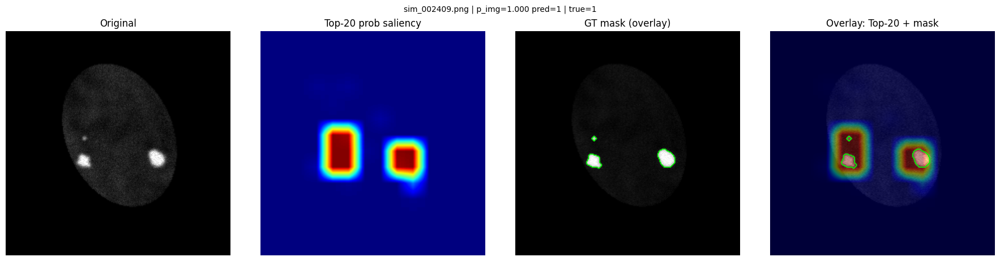

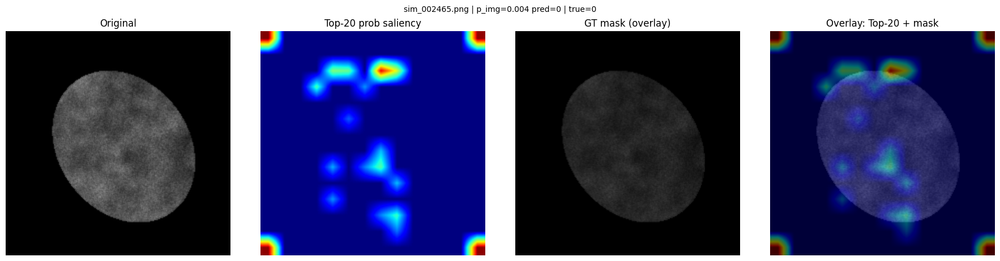

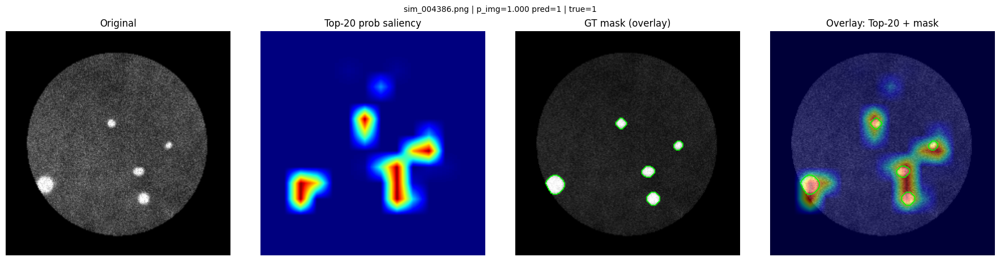

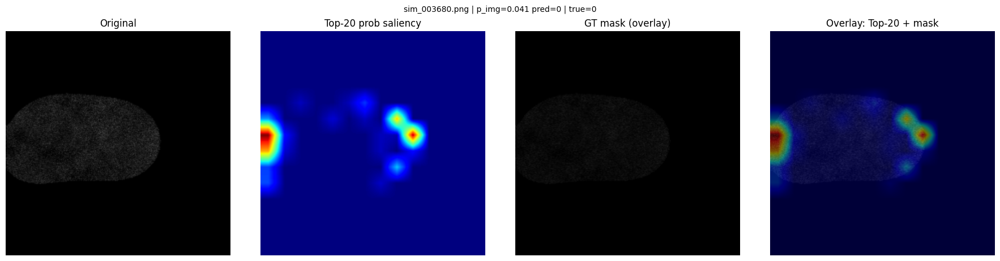

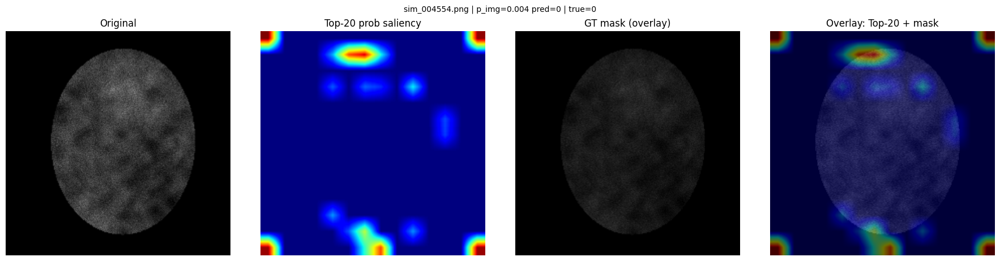

...

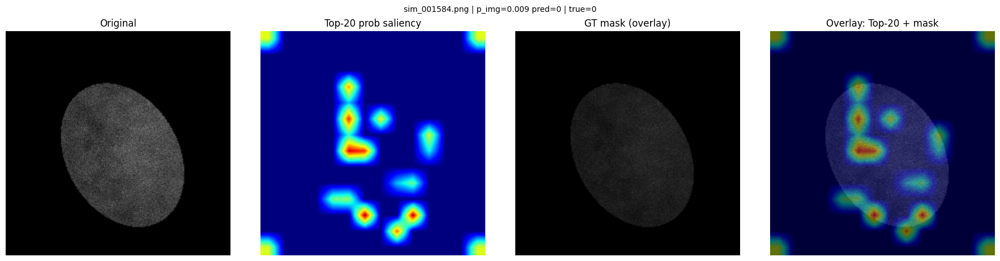

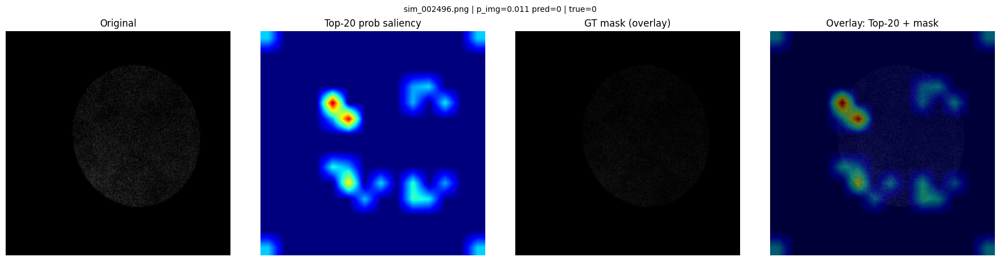

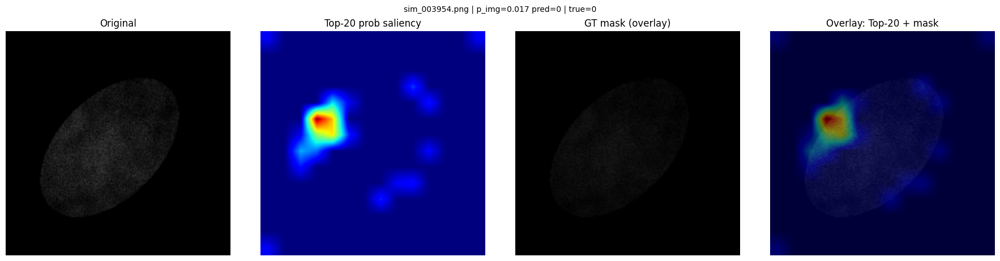

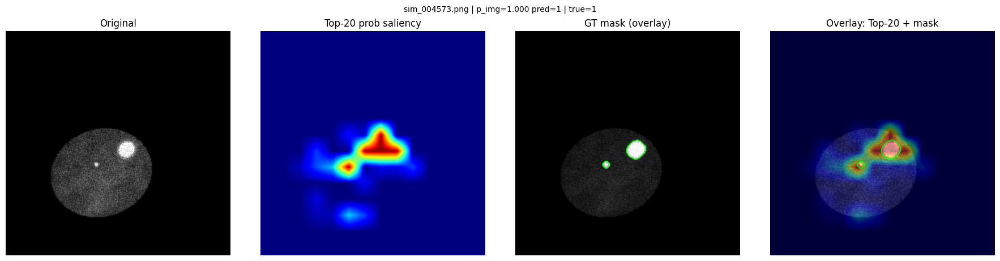

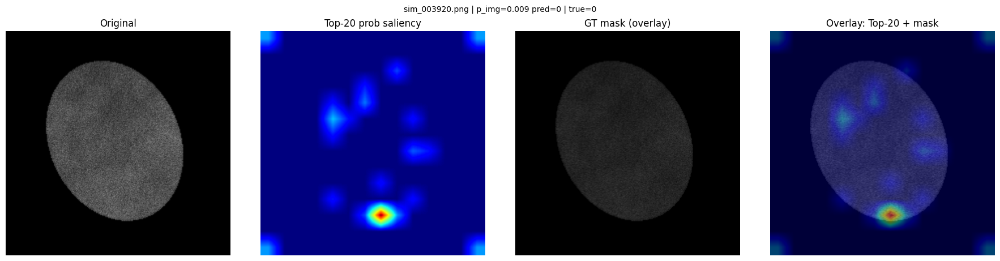

Saved: /content/drive/MyDrive/FYP/prob_preds_with_top20_overlay_and_gt.csv

Confusion Matrix:
  TN=22 FP=0 FN=0 TP=28


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = FociViT_MILMaskGuided(BACKBONE_CKPT).to(device)
model.load_state_dict(torch.load(SAVE_CKPT, map_location=device), strict=True)
model.eval()

df_out = run_topk_prob_viewer_4panels(
    model=model,
    csv_path=test_csv,
    device=device,
    output_dir="/content/drive/MyDrive/FYP/prob_saliency_panels_foci_dino_backbone_ALLimgs_v04_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates+foci_dino_supervised_classifier_v04_simulted_foci_gH2AX_1Gy_4Gy_8Gy_10Gy_Replicates_supervised_CH_foci_SIMULFROMSCRATCH_data_simul",
    out_csv="/content/drive/MyDrive/FYP/prob_preds_with_top20_overlay_and_gt.csv",
    threshold=0.5,
    topk=20,
    blur_sigma_grid=0.0,
    blur_sigma_img=0.0,
    max_rows=50,
    save_fig=True,
    show_fig=True,
)

**Logits + Probabilites**

In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import torch
import torchvision.transforms.functional as TF

# -----------------------------
# Pad/unpad utilities
# -----------------------------
def pad_to_square(pil_img, fill=0):
    w, h = pil_img.size
    side = max(w, h)
    pad_left = (side - w) // 2
    pad_top  = (side - h) // 2
    pad_right = side - w - pad_left
    pad_bottom = side - h - pad_top
    padded = TF.pad(pil_img, padding=[pad_left, pad_top, pad_right, pad_bottom], fill=fill)
    return padded, pad_left, pad_top, side

def unpad_map(map_sq, pad_left, pad_top, orig_w, orig_h):
    x0, y0 = pad_left, pad_top
    x1, y1 = x0 + orig_w, y0 + orig_h
    return map_sq[y0:y1, x0:x1]

# -----------------------------
# GT mask loader (optional)
# -----------------------------
def load_mask01(mask_path, orig_w, orig_h):
    m = Image.open(mask_path).convert("L")
    m = m.resize((orig_w, orig_h), resample=Image.NEAREST)
    m = np.asarray(m).astype(np.float32)
    m = (m > 127).astype(np.float32)
    return m

# -----------------------------
# Patch-map helpers
# -----------------------------
def vec196_to_map01(vec196, grid=14, blur_sigma_grid=0.0, eps=1e-12):
    """
    vec196: numpy array shape (196,)
    returns: normalized (grid,grid) in [0,1]
    """
    m = vec196.reshape(grid, grid).astype(np.float32)
    if blur_sigma_grid and blur_sigma_grid > 0:
        m = gaussian_filter(m, sigma=float(blur_sigma_grid))
    mn, mx = float(m.min()), float(m.max())
    return (m - mn) / (mx - mn + eps)

def topk_mask(vec196, k=20):
    """
    Keeps only the top-k values, zeros the rest.
    Returns a new vec196.
    """
    v = vec196.copy()
    if k >= v.size:
        return v
    thresh = np.partition(v, -k)[-k]  # kth largest threshold
    v[v < thresh] = 0.0
    return v

def upsample_gridmap_to_input(map_grid01, input_size=224):
    """
    (14,14) -> (224,224) float in [0,1]
    """
    im = Image.fromarray((map_grid01 * 255).astype(np.uint8)).resize(
        (input_size, input_size), resample=Image.BILINEAR
    )
    return np.asarray(im).astype(np.float32) / 255.0

def map_back_to_original(map_224, side, pad_left, pad_top, orig_w, orig_h):
    """
    224x224 -> side x side -> unpad -> orig size
    """
    map_sq = Image.fromarray((map_224 * 255).astype(np.uint8)).resize(
        (side, side), resample=Image.BILINEAR
    )
    map_sq = np.asarray(map_sq).astype(np.float32) / 255.0
    map_unpadded = unpad_map(map_sq, pad_left, pad_top, orig_w, orig_h)

    map_final = Image.fromarray((map_unpadded * 255).astype(np.uint8)).resize(
        (orig_w, orig_h), resample=Image.BILINEAR
    )
    return np.asarray(map_final).astype(np.float32) / 255.0

# -----------------------------
# Confusion matrix helper
# -----------------------------
def confusion_matrix_binary(y_true, y_pred):
    tn = fp = fn = tp = 0
    for t, p in zip(y_true, y_pred):
        if t == 1 and p == 1: tp += 1
        elif t == 0 and p == 1: fp += 1
        elif t == 0 and p == 0: tn += 1
        elif t == 1 and p == 0: fn += 1
    return tn, fp, fn, tp

# -----------------------------
# Main viewer
# -----------------------------
@torch.no_grad()
def run_mil_all_patchmaps_viewer(
    model,
    csv_path,
    device,
    output_dir=None,
    out_csv=None,
    threshold=0.5,
    input_size=224,
    grid=14,
    topk=20,                 # show only top-20 patches
    blur_sigma_grid=0.0,     # blur on 14x14
    blur_sigma_img=0.0,      # blur after upsample
    max_rows=None,
    save_fig=True,
    show_fig=True,
    dpi=150,
    mean=(0.5,0.5,0.5),
    std=(0.25,0.25,0.25),
):
    df = pd.read_csv(csv_path)
    if max_rows is None:
        max_rows = len(df)

    has_mask_path = "mask_path" in df.columns
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)
        print("Saving figures to:", output_dir)

    model.eval()

    kept_idx = []
    pimg_all, preds_all = [], []
    y_true_list, y_pred_list = [], []

    for idx, row in df.iloc[:max_rows].iterrows():
        img_path = row["image_path"]
        true_label = row.get("label", None)
        mask_path = row.get("mask_path", None) if has_mask_path else None

        try:
            img_pil = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"[SKIP] {img_path}: {e}")
            continue

        orig_w, orig_h = img_pil.size

        gt_mask01 = None
        if has_mask_path and isinstance(mask_path, str) and os.path.exists(mask_path):
            try:
                gt_mask01 = load_mask01(mask_path, orig_w, orig_h)
            except Exception as e:
                print(f"[WARN] mask load failed: {mask_path} | {e}")

        # pad->square->resize
        img_sq, pad_left, pad_top, side = pad_to_square(img_pil, fill=0)
        img_in = img_sq.resize((input_size, input_size), resample=Image.BILINEAR)

        # tensor + normalize
        x = TF.to_tensor(img_in)
        x = TF.normalize(x, mean=list(mean), std=list(std))
        x = x.unsqueeze(0).to(device)

        # forward: (p_img, patch_logits, patch_probs)
        p_img, patch_logits, patch_probs = model(x)

        p_img_val = float(p_img.view(-1)[0].item())
        pred_val = 1.0 if p_img_val >= threshold else 0.0

        # store
        kept_idx.append(idx)
        pimg_all.append(p_img_val)
        preds_all.append(pred_val)

        if true_label is not None and not pd.isna(true_label):
            y_true_list.append(int(true_label))
            y_pred_list.append(int(pred_val))

        # pull vectors
        logits_vec = patch_logits[0].detach().float().cpu().numpy()   # (196,)
        probs_vec  = patch_probs[0].detach().float().cpu().numpy()    # (196,)

        # make 4 maps: probs, logits, topk(probs), topk(logits)
        probs_map14  = vec196_to_map01(probs_vec,  grid=grid, blur_sigma_grid=blur_sigma_grid)
        logits_map14 = vec196_to_map01(logits_vec, grid=grid, blur_sigma_grid=blur_sigma_grid)

        probs_top_vec  = topk_mask(probs_vec,  k=topk)
        logits_top_vec = topk_mask(logits_vec, k=topk)

        probs_top14  = vec196_to_map01(probs_top_vec,  grid=grid, blur_sigma_grid=blur_sigma_grid)
        logits_top14 = vec196_to_map01(logits_top_vec, grid=grid, blur_sigma_grid=blur_sigma_grid)

        # upsample to 224
        probs_224      = upsample_gridmap_to_input(probs_map14,  input_size=input_size)
        logits_224     = upsample_gridmap_to_input(logits_map14, input_size=input_size)
        probs_top_224  = upsample_gridmap_to_input(probs_top14,  input_size=input_size)
        logits_top_224 = upsample_gridmap_to_input(logits_top14, input_size=input_size)

        if blur_sigma_img and blur_sigma_img > 0:
            probs_224      = gaussian_filter(probs_224, sigma=float(blur_sigma_img))
            logits_224     = gaussian_filter(logits_224, sigma=float(blur_sigma_img))
            probs_top_224  = gaussian_filter(probs_top_224, sigma=float(blur_sigma_img))
            logits_top_224 = gaussian_filter(logits_top_224, sigma=float(blur_sigma_img))

        # map back to original size
        probs_final      = map_back_to_original(probs_224,      side, pad_left, pad_top, orig_w, orig_h)
        logits_final     = map_back_to_original(logits_224,     side, pad_left, pad_top, orig_w, orig_h)
        probs_top_final  = map_back_to_original(probs_top_224,  side, pad_left, pad_top, orig_w, orig_h)
        logits_top_final = map_back_to_original(logits_top_224, side, pad_left, pad_top, orig_w, orig_h)

        # ---- Plot: 2 rows x 4 cols (plus GT mask overlay if available)
        fig, axes = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

        # Row 0
        axes[0,0].imshow(img_pil); axes[0,0].set_title("Original"); axes[0,0].axis("off")

        axes[0,1].imshow(probs_final, cmap="jet", vmin=0, vmax=1)
        axes[0,1].set_title("patch_probs map"); axes[0,1].axis("off")

        axes[0,2].imshow(logits_final, cmap="jet", vmin=0, vmax=1)
        axes[0,2].set_title("patch_logits map"); axes[0,2].axis("off")

        axes[0,3].imshow(img_pil)
        axes[0,3].imshow(probs_final, cmap="jet", alpha=0.45, vmin=0, vmax=1)
        axes[0,3].set_title("Overlay (probs)"); axes[0,3].axis("off")

        # Row 1
        axes[1,0].imshow(probs_top_final, cmap="jet", vmin=0, vmax=1)
        axes[1,0].set_title(f"Top-{topk} probs"); axes[1,0].axis("off")

        axes[1,1].imshow(logits_top_final, cmap="jet", vmin=0, vmax=1)
        axes[1,1].set_title(f"Top-{topk} logits"); axes[1,1].axis("off")

        axes[1,2].imshow(img_pil)
        axes[1,2].imshow(probs_top_final, cmap="jet", alpha=0.45, vmin=0, vmax=1)
        axes[1,2].set_title(f"Overlay Top-{topk} (probs)"); axes[1,2].axis("off")

        # GT overlay panel (or blank)
        axes[1,3].imshow(img_pil)
        if gt_mask01 is not None:
            axes[1,3].imshow(gt_mask01, cmap="spring", alpha=0.35, vmin=0, vmax=1)
            axes[1,3].set_title("GT mask overlay")
        else:
            axes[1,3].set_title("GT mask overlay (none)")
        axes[1,3].axis("off")

        title = f"{os.path.basename(img_path)} | p_img={p_img_val:.3f} pred={int(pred_val)}"
        if true_label is not None and not pd.isna(true_label):
            title += f" | true={int(true_label)}"
        fig.suptitle(title, fontsize=10)

        if save_fig and output_dir is not None:
            base = os.path.splitext(os.path.basename(img_path))[0]
            save_name = f"{idx:05d}_{base}_allmaps_pred{int(pred_val)}_p{p_img_val:.3f}.png"
            fig.savefig(os.path.join(output_dir, save_name), dpi=dpi, bbox_inches="tight")

        if show_fig:
            plt.show()
        plt.close(fig)

    # Save CSV
    df_out = df.loc[kept_idx].copy()
    df_out["p_img"] = pimg_all
    df_out["pred_label"] = preds_all
    if out_csv is not None:
        df_out.to_csv(out_csv, index=False)
        print("Saved:", out_csv)

    # Confusion matrix (if labels exist)
    if len(y_true_list) > 0 and len(y_true_list) == len(y_pred_list):
        tn, fp, fn, tp = confusion_matrix_binary(y_true_list, y_pred_list)
        print("\nConfusion Matrix:")
        print(f"  TN={tn} FP={fp} FN={fn} TP={tp}")

    return df_out


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = FociViT_MILMaskGuided(BACKBONE_CKPT).to(device)
model.load_state_dict(torch.load(SAVE_CKPT, map_location=device), strict=True)
model.eval()

df_out = run_mil_all_patchmaps_viewer(
    model=model,
    csv_path="/content/drive/MyDrive/FYP/foci_supervised_test_v02_pred.csv",
    device=device,
    output_dir="/content/drive/MyDrive/FYP/all_mil_saliency_panels_with_mask_foci_dino_backbone_v05_simulted_foci_natural_CH_foci_maskguided_mil_head_best_v1_simulted_foci_natural+clear_foci_supervised_test_v02_pred",
    out_csv="/content/drive/MyDrive/FYP/mil_preds_with_maskmetrics_v06_foci_supervised_test_v02_pred_2.csv",
    threshold=0.5,
    topk=20,
    blur_sigma_grid=0.0,   # keep 0 for faithful; try 0.5 if too blocky
    blur_sigma_img=0.0,    # keep 0 for faithful; try 1.0 if too blocky
    max_rows=300,
    save_fig=True,
    show_fig=True,
)
